In [3]:
# Mount Google Drive to acess files later

import os
import sys
try:
    from google.colab import drive
    colabFlag = True
    PATH_DATASETS = '/content/gdrive/MyDrive/ML_practice' ## Set this to where your data is stored within Google Drive
    drive.mount('/content/gdrive', force_remount=True)
    print(f"Using Google Colab with file path {PATH_DATASETS}")
except:
    colabFlag = False

    PATH_DATASETS = "" ## Set this to where your data is stored relative to your current working directory

    print(f"Not using Google Colab. File path will be: {PATH_DATASETS}")

sys.path.append('/content/gdrive/MyDrive/ML_practice')

Mounted at /content/gdrive
Using Google Colab with file path /content/gdrive/MyDrive/ML_practice


In [5]:
# Dependencies
# Install for colab
!pip install torchmetrics pytorch-lightning carbontracker -qq

import copy
import time
import os
import random
import numpy as np
import pandas as pd
import imutils
import matplotlib.pyplot as plt
import math
from PIL import Image
import matplotlib.image as mpimg
from collections import OrderedDict
from skimage import io, transform
from math import *
import xml.etree.ElementTree as ET

import torch
import torchvision
from torchvision.datasets import SVHN
import torchmetrics
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, random_split
from torch.utils.data.dataset import Dataset
from IPython.core.display import display
from torchmetrics import Accuracy, MeanSquaredError
from IPython.display import clear_output

from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks.progress import TQDMProgressBar
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import Callback, ModelCheckpoint

from carbontracker.tracker import CarbonTracker

from torch.optim.lr_scheduler import StepLR

# Set batch size
BATCH_SIZE = 256 if torch.cuda.is_available() else 64

# For reproducability
seed_everything(42, workers=True )

# Define GPU number
GPU_indx = 0
device = torch.device(GPU_indx if torch.cuda.is_available() else 'cpu')
num_workers = 4 ## Set to your device

INFO:lightning_fabric.utilities.seed:Seed set to 42


In [13]:
# Load in dataloader train and val

# Download MNIST dataset from torchvision and create datasets
train_dataset = torchvision.datasets.MNIST(PATH_DATASETS, train=True, download=True, transform=transforms.ToTensor())
test_dataset  = torchvision.datasets.MNIST(PATH_DATASETS, train=False, download=True, transform=transforms.ToTensor())

# Perform Random Split with 20% breakup
train_set_size = int(len(train_dataset) * 0.8)
valid_set_size = len(train_dataset) - train_set_size
train_data, val_data = random_split(train_dataset, [train_set_size, valid_set_size])
BATCH_SIZE = 256

# Create dataloaders
train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, num_workers=num_workers, shuffle=True)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, num_workers=num_workers, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, num_workers=num_workers, shuffle=False)

# Let's visualise some shapes
print("Train DataSET size:", train_set_size)
print("Test DataSET size:", len(test_dataset))
print("Val DataSET size:", valid_set_size)
print("\n")
print("Train DataLOADER size:", len(train_loader))
print("Test DataLOADER size:", len(test_loader))
print("Val DataLOADER size:", len(valid_loader))

Train DataSET size: 48000
Test DataSET size: 10000
Val DataSET size: 12000


Train DataLOADER size: 188
Test DataLOADER size: 40
Val DataLOADER size: 47


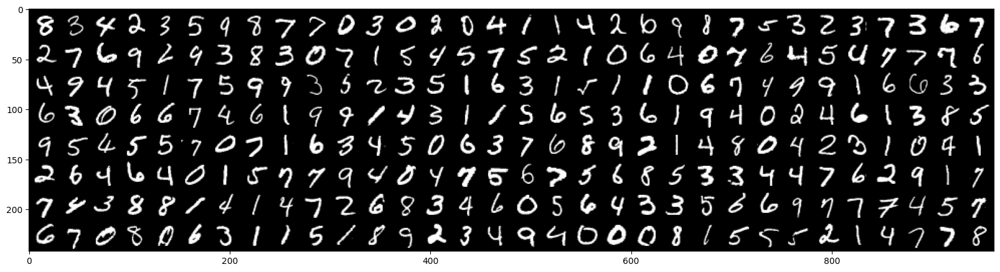

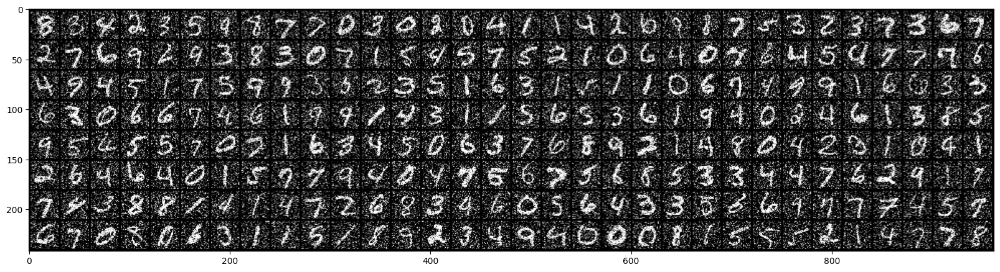

In [14]:
# Make noisy data

data, labels = next(iter(train_loader))

# Create noisy data
noise_percentage = 0.4
noisy_data = data + torch.randn_like(data) * noise_percentage
noisy_data = torch.clip(noisy_data, 0, 1)

# visualize clean dataset using torchvision grid
plt.figure(figsize = (20,10))
out = torchvision.utils.make_grid(data, nrow=32, normalize=True)
plt.imshow(out.numpy().transpose((1, 2, 0)))

# visualize noisy dataset using torchvision grid
plt.figure(figsize = (20,10))
out = torchvision.utils.make_grid(noisy_data, nrow=32, normalize=True)
plt.imshow(out.numpy().transpose((1, 2, 0)))

In [16]:
# DAE modules

class Encoder(nn.Module):
    def __init__(self):
        super().__init__()

        ## Encoder section

        linear_layer = nn.Linear(784,128) # 128 neurons as the output

        self.encoder = nn.Sequential(
            linear_layer,
            nn.BatchNorm1d(128),
            nn.ReLU(True)
        )

    def forward(self, x):

        # Forward pass of your encoder
        # Need to flaten to do that
        x = x.view(x.shape[0], -1)
        return self.encoder(x)


class Decoder(nn.Module):
    def __init__(self):
        super().__init__()

        linear_layer = nn.Linear(128, 784) # AEs are symmetrical
        self.sigmoid= nn.Sigmoid()

        # Decoder section
        self.decoder = nn.Sequential(
            linear_layer,
            nn.ReLU(True)
        )

    def forward(self, x):

        BatchSize = x.shape[0] # Reshape depends on given batch size

        x = self.decoder(x)
        x = self.sigmoid(x)
        x = torch.reshape(x,(BatchSize,1,28,28))

        return x

In [17]:
# A simple DAE based on MLP networks

class Simple_AE(LightningModule):

    def __init__(self, num_classes=10, learning_rate=1e-3):
        super().__init__()

        self.learning_rate = learning_rate
        self.num_classes = num_classes
        self.criterion = nn.MSELoss()   # Experiment with this bad boy a bit

        self.encoder = Encoder()  # Initialise encoder
        self.decoder = Decoder()  # Initialise decoder

    def forward(self, x):
        # Forward pass through encoder and decoder
        x = self.encoder(x)
        x = self.decoder(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        noisy_data = x + torch.randn_like(x) * noise_percentage   # Noise
        noisy_data = torch.clip(noisy_data, 0, 1)

        predicted_x = self(noisy_data)
        loss = self.criterion(predicted_x, x)

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        noisy_data = x + torch.randn_like(x) * noise_percentage
        noisy_data = torch.clip(noisy_data, 0, 1)

        predicted_x = self(noisy_data)
        loss = self.criterion(predicted_x, x)

        # Calling self.log will surface up scalars in TensorBoard
        self.log("val_loss", loss, prog_bar=True)



    def test_step(self, batch, batch_idx):
        x, y = batch
        noisy_data = x + torch.randn_like(x) * noise_percentage
        noisy_data = torch.clip(noisy_data, 0, 1)

        ## Remember, this is where we are testing. So you will pass in your noisy_data to the encoder, and use that latent code to pass through your decoder
        predicted_x = self(noisy_data)
        loss = self.criterion(predicted_x, x)

        # Calling self.log will surface up scalars for you in TensorBoard
        self.log("test_loss", loss, prog_bar=True)


    def predict_step(self, batch, batch_idx):
        x, y = batch
        noisy_data = x + torch.randn_like(x) * noise_percentage
        noisy_data = torch.clip(noisy_data, 0, 1)

        pred_x = self.forward(noisy_data)

        return (pred_x, noisy_data, x)

    def configure_optimizers(self):

        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)

        return optimizer

    ####################
    # DATA RELATED HOOKS
    ####################

    def train_dataloader(self):
        return train_loader

    def val_dataloader(self):
        return valid_loader

    def test_dataloader(self):
        return test_loader

In [18]:
# Train the model to see how it does!

# Initialize the model
model_ae = Simple_AE()
max_epochs = 50

# Define checkpoint callback function to save best model
checkpoint_callback_d = ModelCheckpoint(
    monitor="val_loss",
    dirpath="/content/gdrive/MyDrive/Assignment2/folder/DAE3/checkpoints",
    save_top_k=1,
    mode="min",
    every_n_epochs=1
)

# Call the Trainer and train the model
trainer_task_d = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,  # limiting got iPython runs
    max_epochs=max_epochs,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_d],
    logger=CSVLogger(save_dir="/content/gdrive/MyDrive/Assignment2/folder/DAE3/logs"),
)

trainer_task_d.fit(model_ae)

# Test the model and report test accuracy and test loss
trainer_task_d.test()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type    | Params
--------------------------------------
0 | criterion | MSELoss | 0     
1 | encoder   | Encoder | 100 K 
2 | decoder   | Decoder | 101 K 
--------------------------------------
201 K     Trainable params
0         Non-trainable params
201 K     Total params
0.807     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/gdrive/MyDrive/Assignment2/folder/DAE3/checkpoints/epoch=47-step=9024.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/gdrive/MyDrive/Assignment2/folder/DAE3/checkpoints/epoch=47-step=9024.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.21646283566951752    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.21646283566951752}]

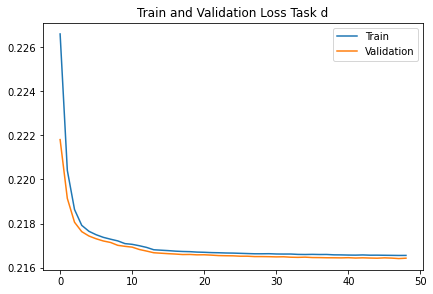

In [ ]:
# Plot both training and validation losses
traing_data_task_d = pd.read_csv(trainer_task_d.logger.log_dir + "/metrics.csv")
traing_data_task_d.set_index("epoch", inplace=True)
traing_data_task_d = traing_data_task_d.groupby(level=0).sum().drop("step", axis=1)

# Plot using matplotlib
fig = plt.figure(figsize = (15,10))

# Loss 1a
plt.subplot(2,2,1)

plt.plot(traing_data_task_d["train_loss"][:-1])
plt.plot(traing_data_task_d["val_loss"][:-1])

plt.title("Train and Validation Loss Task d")
_ = plt.legend(["Train", "Validation"])

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 188it [00:00, ?it/s]

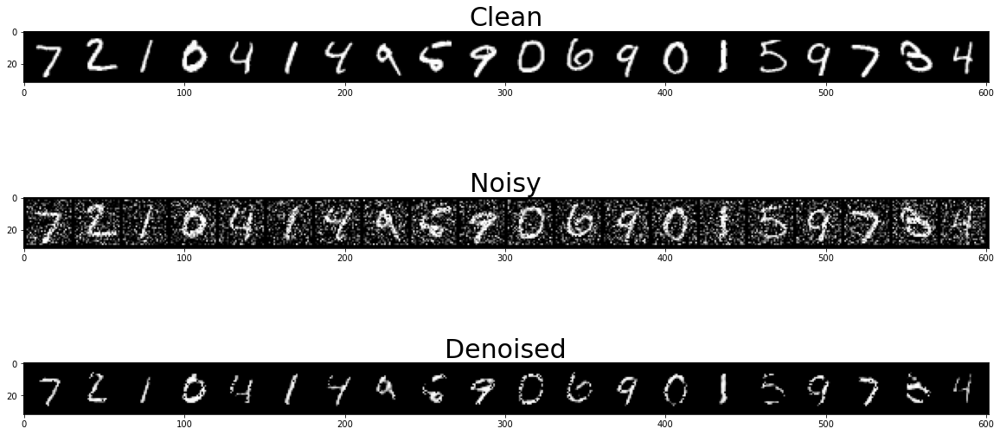

In [ ]:
# Visualise predictions

# Generate predictions using predict function
outputs = trainer_task_d.predict(model_ae, test_loader)

plt.figure(figsize = (20,10))
plt.subplot(3,1,1)
plt.title("Clean", fontsize=30)
out_1 = torchvision.utils.make_grid(outputs[0][2][0:20], nrow=20, normalize=True)
plt.imshow(out_1.numpy().transpose((1, 2, 0)))


plt.subplot(3,1,2)
plt.title("Noisy", fontsize=30)
out_2 = torchvision.utils.make_grid(outputs[0][1][0:20], nrow=20, normalize=True)
plt.imshow(out_2.numpy().transpose((1, 2, 0)))


plt.subplot(3,1,3)
plt.title("Denoised", fontsize=30)
out_2 = torchvision.utils.make_grid(outputs[0][0][0:20], nrow=20, normalize=True)
plt.imshow(out_2.numpy().transpose((1, 2, 0)))

In [ ]:
## Let's compare an MLP to a CNN on image classification (SVHN dataset)

# SVHN Datasets time

# Define transform to convert image into a Tensor
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# Init Train DataLoader from SVHN Dataset
train_ds = SVHN(PATH_DATASETS, split="train", download=True, transform=transform)

# Perform Random Split
train_ds, val_ds = random_split(train_ds, [int(len(train_ds)-math.floor(len(train_ds)*0.2)), math.ceil(int(len(train_ds)*0.2))])

val_loader = DataLoader(val_ds, shuffle=False, batch_size=BATCH_SIZE, num_workers=num_workers, persistent_workers=True, pin_memory=True)
train_loader = DataLoader(train_ds, shuffle=True, batch_size=BATCH_SIZE, num_workers=num_workers, persistent_workers=True, pin_memory=True)

# Init Test DataLoader from SVHN Dataset
test_ds = SVHN(PATH_DATASETS, split="test", download=True, transform=transform)
test_loader = DataLoader(test_ds, shuffle=False, batch_size=BATCH_SIZE, num_workers=num_workers, persistent_workers=True, pin_memory=True)

#NOTE:pin_memory is only useful if you are training with a GPU, if it is True then the GPU will pre-allocate
#memory for the NEXT batch so the CPU-GPU transfer can be handled by the DMA controller freeing up the CPU

Using downloaded and verified file: /content/gdrive/MyDrive/Assignment2/folder/train_32x32.mat
Using downloaded and verified file: /content/gdrive/MyDrive/Assignment2/folder/test_32x32.mat


In [ ]:
# Visualising data

# We can create an itterater using the dataloaders and take a random sample
images, labels = next(iter(train_loader))
print("The input data shape is :\n", images.shape)
print("The target output data shape is :\n", labels.shape)

The input data shape is :
 torch.Size([256, 3, 32, 32])
The target output data shape is :
 torch.Size([256])


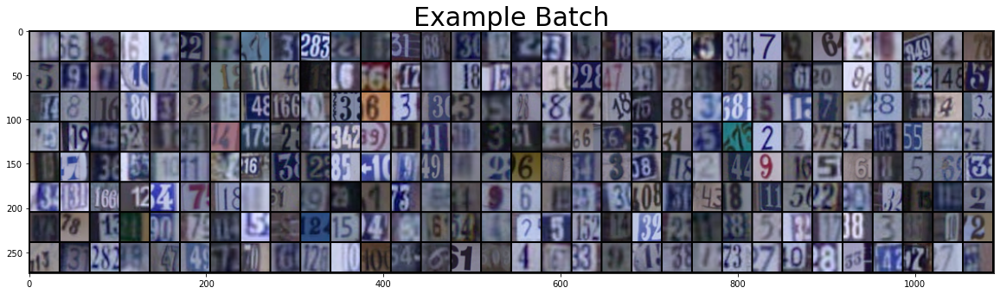

In [ ]:
# Let's visualise an entire batch of images!

# Revert normalization
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.255]
)

images2 = copy.deepcopy(inv_normalize(images)) # Copy the batch so that the reverse normalization does not affect the original images since it will write to memory

# Plot minbatch
plt.figure(figsize = (20,20))
plt.plot(1,1,1)
plt.title("Example Batch", fontsize=30)
out_1 = torchvision.utils.make_grid(images2, nrow=32, normalize=True)
plt.imshow(out_1.numpy().transpose((1, 2, 0)))

In [ ]:
# Let's the simple MLP and CNN

class Simple_MLP(LightningModule):

    def __init__(self, num_classes=10, learning_rate=1e-1):
        super().__init__()

        self.learning_rate = learning_rate
        self.num_classes = num_classes
        self.criterion = nn.CrossEntropyLoss()

        #We will use 3 linear layers
        #The input to the model is 3072 (3x32x32 - the image size (RGB image))
        ## FC1 has output of 256
        ## FC2 has output of 32
        ## FC3 has output of num_classes

        self.fc1 = nn.Linear(3072, 256)
        self.fc2 = nn.Linear(256, 32)
        self.fc3 = nn.Linear(32, self.num_classes)

        self.train_accuracy = Accuracy()
        self.val_accuracy = Accuracy()
        self.test_accuracy = Accuracy()


    def forward(self, x):

        # With shape BSx3x32x32 we need to flatten it to BSx3072 to use linear layer

        x = x.view(x.shape[0], -1)

        x = F.relu(self.fc1(x))

        x = F.relu(self.fc2(x))

        x = self.fc3(x)

        return x

    def training_step(self, batch, batch_idx):

        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = logits.argmax(1)
        self.train_accuracy.update(preds, y)

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", self.train_accuracy, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = logits.argmax(1)
        self.val_accuracy.update(preds, y)

        self.log("val_loss", loss, prog_bar=True, on_epoch=True)
        self.log("val_acc", self.val_accuracy, prog_bar=True, on_epoch=True)

        return preds

    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = logits.argmax(1)
        self.test_accuracy.update(preds, y)

        self.log("test_loss", loss, prog_bar=True)
        self.log("test_acc", self.test_accuracy, prog_bar=True)

        return preds

    def configure_optimizers(self):
        optimizer = optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        return optimizer

    ####################
    # DATA RELATED HOOKS
    ####################

    def train_dataloader(self):
        return train_loader

    def val_dataloader(self):
        return val_loader

    def test_dataloader(self):
        return test_loader

In [ ]:


# Using modular convolutional blocks.
# Activation function is ReLU
# The convolutional block module will have 2 convolutional layers.
# The first conv2d will have kernel size = 3, padding = 0, stride = 1
# The second conv2d will have kernel size = 3, padding = 1, stride = 1

# channels_in will only go into the first convolutional block
# channels_out will be used for every other channel

class ConvBlock(nn.Module):

    def __init__(self, channels_in, channels_out):
        super(ConvBlock, self).__init__()     # Call constructor
        #  Using F.relu instead because I'm not using a sequential module here

        self.conv1 = nn.Conv2d(channels_in, channels_out, 3, padding = 0, stride = 1)
        self.conv2 = nn.Conv2d(channels_out, channels_out, 3, padding = 1 , stride = 1)

    def forward(self, x):

        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))

        return x


# The CNN

class Simple_CNN(LightningModule):

    def __init__(self, num_classes=10, learning_rate=1e-1):
        super().__init__()

        self.learning_rate = learning_rate
        self.num_classes = num_classes
        self.criterion = nn.CrossEntropyLoss()

        self.conv_blk1 = ConvBlock(3, 64)
        self.conv_blk2 = ConvBlock(64, 128)

        self.GAP = nn.AvgPool2d(9)        # 1152/128 = 9

        # The final fully connected layer will have:
        # input = 1152, output = num_classes
        self.fc1 = nn.Linear(1152, num_classes)

        self.train_accuracy = Accuracy()
        self.val_accuracy = Accuracy()
        self.test_accuracy = Accuracy()


    def forward(self, x):

        # 3 convolutional BLOCKS into a GAP into a FC1.

        x = self.conv_blk1(x)
        x = self.conv_blk2(x)

        x = self.GAP(x)

        x = x.view(x.shape[0], -1)

        x = self.fc1(x)

        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = logits.argmax(1)
        self.train_accuracy.update(preds, y)

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", self.train_accuracy, prog_bar=True, on_step=False, on_epoch=True)

        return loss


    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = logits.argmax(1)
        self.val_accuracy.update(preds, y)

        self.log("val_loss", loss, prog_bar=True, on_epoch=True)
        self.log("val_acc", self.val_accuracy, prog_bar=True, on_epoch=True)

        return preds


    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = logits.argmax(1)
        self.test_accuracy.update(preds, y)

        self.log("test_loss", loss, prog_bar=True)
        self.log("test_acc", self.test_accuracy, prog_bar=True)

        return preds

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        return optimizer

    ####################
    # DATA RELATED HOOKS
    ####################

    def train_dataloader(self):
        return train_loader
    def val_dataloader(self):
        return val_loader
    def test_dataloader(self):
        return test_loader

In [ ]:
# Visualise class

class VisualizeSamplePredictionsCallback(Callback):

    def on_test_batch_end(
        self, trainer, pl_module, outputs, batch, batch_idx, dataloader_idx):
        """Called when the test batch ends."""

        # `outputs` comes from `LightningModule.test_step`
        # which corresponds to our model predictions during testing time in this case

        # Only do this for the first batch
        if batch_idx == 0:

          # Grab the images and put them on CPU()
          x, y = batch
          x = x.cpu()
          y = y.cpu()

          preds = outputs.cpu()

          plt.figure(figsize = (20,20))

          # Displaying 10
          num_images_to_display = 10
          for i in range(0,num_images_to_display):
            plt.subplot(1, num_images_to_display, (i+1))
            title = "Ground Truth: " + str(y[i].item()) + "\n" + "Prediction: " + str(preds[i].item())
            plt.title(title, fontsize=10)
            out = torchvision.utils.make_grid(x[i], nrow=1, normalize=True)
            plt.imshow(out.numpy().transpose((1, 2, 0)))

CarbonTracker: The following components were found: GPU with device(s) Tesla T4.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:616: UserWarning: Checkpoint directory /content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/MLPcheckpoint exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type             | Params
----------------------------------------------------
0 | criterion      | CrossEntropyLoss | 0     
1 | fc1            | Linear           | 786 K 
2 | fc2            | Linear           | 8.2 K 
3 | fc3    

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

CarbonTracker: 
Actual consumption for 1 epoch(s):
	Time:	0:04:47
	Energy:	0.004102 kWh
	CO2eq:	1.206931 g
	This is equivalent to:
	0.010024 km travelled by car
CarbonTracker: 
Predicted consumption for 1 epoch(s):
	Time:	0:04:47
	Energy:	0.004102 kWh
	CO2eq:	1.206931 g
	This is equivalent to:
	0.010024 km travelled by car
CarbonTracker: Finished monitoring.


INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/MLPcheckpoint/epoch=12-step=2977.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from checkpoint at /content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/MLPcheckpoint/epoch=12-step=2977.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7813844680786133
        test_loss            0.776386559009552
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.776386559009552, 'test_acc': 0.7813844680786133}]

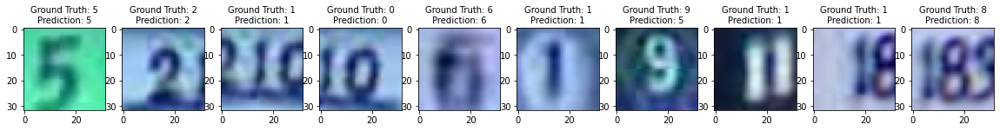

In [ ]:
# Training time!

# Testing carbon tracker as well

# Initialize the MLP model
max_epochs = 100    #100
model = Simple_MLP()

# Initialize checkpoint callback to save the best model using validation loss
checkpoint_callback_s1 = ModelCheckpoint( monitor="val_loss",
                                          dirpath="/content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/MLPcheckpoint/",
                                          save_top_k=1,
                                          mode="min",
                                          every_n_epochs=1
  )

# Use the carbon_tracker across the entire max_epochs to reduce output clutter
carbon_tracker_mlp = CarbonTracker(epochs = 1)

# Stop after 5 epochs of no improvement in validation loss
early_stopping_s1 = EarlyStopping('val_loss', patience = 5, mode='min')

trainer_task_s1 = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,  # limiting got iPython runs
    max_epochs=max_epochs ,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_s1, early_stopping_s1, VisualizeSamplePredictionsCallback()],
    logger=CSVLogger(save_dir="/content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/MLPlogs/"),
)


# This carbon tracker is pretty cool
carbon_tracker_mlp.epoch_start()

trainer_task_s1.fit(model)

carbon_tracker_mlp.epoch_end()


# Test the model and report test accuracy and test loss
trainer_task_s1.test()

CarbonTracker: The following components were found: GPU with device(s) Tesla T4.
CarbonTracker: The following components were found: GPU with device(s) Tesla T4.


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:616: UserWarning: Checkpoint directory /content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/CNNcheckpoint exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type             | Params
----------------------------------------------------
0 | criterion      | CrossEntropyLoss | 0     
1 | conv_blk1      | ConvBlock        | 38.7 K
2 | conv_blk2      | ConvBlock        | 221 K 
3 | GAP    

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

CarbonTracker: 
Actual consumption for 1 epoch(s):
	Time:	0:11:44
	Energy:	0.019713 kWh
	CO2eq:	5.799659 g
	This is equivalent to:
	0.048170 km travelled by car
CarbonTracker: 
Actual consumption for 1 epoch(s):
	Time:	0:11:44
	Energy:	0.019713 kWh
	CO2eq:	5.799659 g
	This is equivalent to:
	0.048170 km travelled by car
CarbonTracker: 
Predicted consumption for 1 epoch(s):
	Time:	0:11:44
	Energy:	0.019713 kWh
	CO2eq:	5.799659 g
	This is equivalent to:
	0.048170 km travelled by car
CarbonTracker: 
Predicted consumption for 1 epoch(s):
	Time:	0:11:44
	Energy:	0.019713 kWh
	CO2eq:	5.799659 g
	This is equivalent to:
	0.048170 km travelled by car
CarbonTracker: Finished monitoring.
CarbonTracker: Finished monitoring.


INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/CNNcheckpoint/epoch=29-step=6870.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from checkpoint at /content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/CNNcheckpoint/epoch=29-step=6870.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9098801612854004
        test_loss           0.3150990307331085
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.3150990307331085, 'test_acc': 0.9098801612854004}]

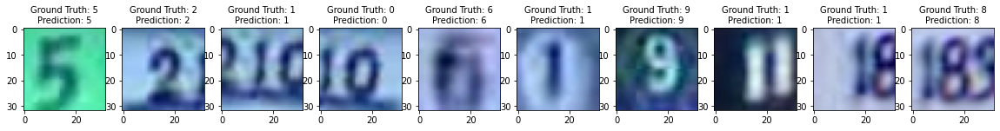

In [ ]:
# Now do CNN, same as above

# Initialize the CNN model
max_epochs = 100  #100
model_cnn = Simple_CNN()

# Initialize checkpoint callback to save the best model using validation loss
checkpoint_callback_s2 = ModelCheckpoint( monitor="val_loss",
                                          dirpath="/content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/CNNcheckpoint/",
                                          save_top_k=1,
                                          mode="min",
                                          every_n_epochs=1)

carbon_tracker_cnn = CarbonTracker(epochs = 1)

early_stopping_s2 = EarlyStopping('val_loss', patience = 5, mode='min')

trainer_task_s2 = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,
    max_epochs=max_epochs,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_s2, early_stopping_s2, VisualizeSamplePredictionsCallback()],
    logger=CSVLogger(save_dir="/content/gdrive/MyDrive/Assignment2/folder/MLPvCNN/CNNlogs/"),
)


carbon_tracker_cnn.epoch_start()

trainer_task_s2.fit(model_cnn)

carbon_tracker_cnn.epoch_end()



trainer_task_s2.test()

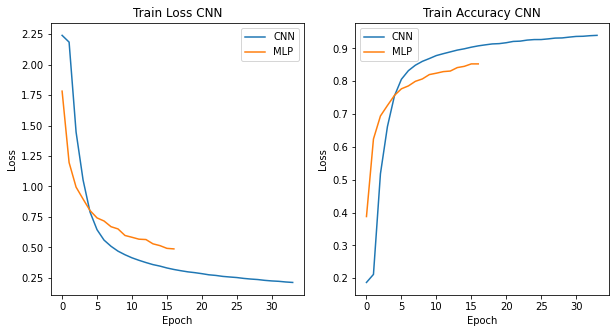

In [ ]:
# How did they go!

# Read the logs
trainer_data_task_s2 = pd.read_csv(trainer_task_s2.logger.log_dir + "/metrics.csv")
trainer_data_task_s2.set_index("epoch", inplace=True)
trainer_data_task_s2 = trainer_data_task_s2.groupby(level=0).sum().drop("step", axis=1)

trainer_data_task_s1 = pd.read_csv(trainer_task_s1.logger.log_dir + "/metrics.csv")
trainer_data_task_s1.set_index("epoch", inplace=True)
trainer_data_task_s1 = trainer_data_task_s1.groupby(level=0).sum().drop("step", axis=1)

## Plot validation and train loss, both against epoch
fig_2 = plt.figure(figsize = (10,5))

## Loss ##
plt.subplot(1,2,1)
plt.plot(trainer_data_task_s2["train_loss"][:-1])
plt.plot(trainer_data_task_s1["train_loss"][:-1])

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train Loss CNN")
_ = plt.legend(["CNN", "MLP"])


## Accuracy ##
plt.subplot(1,2,2)
plt.plot(trainer_data_task_s2["train_acc"][:-1])
plt.plot(trainer_data_task_s1["train_acc"][:-1])

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train Accuracy CNN")
_ = plt.legend(["CNN", "MLP"])


In [ ]:
# Occlusion Sensitivity Analysis

# Load pretrained model (Resnet18) using torch hub
resnet_model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)

# Change model's mode into eval and transfer to the device you are using
resnet_model.eval()

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# Transformation with normalization
# Make sure images are 224x224 as that's what RESNET is trained on
preprocess = transforms.Compose([  transforms.Resize(256),
                                   transforms.CenterCrop(224),
                                   transforms.ToTensor(),
                                   transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),])

In [ ]:
# Get an image of dog
with open("/content/gdrive/MyDrive/folder/imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

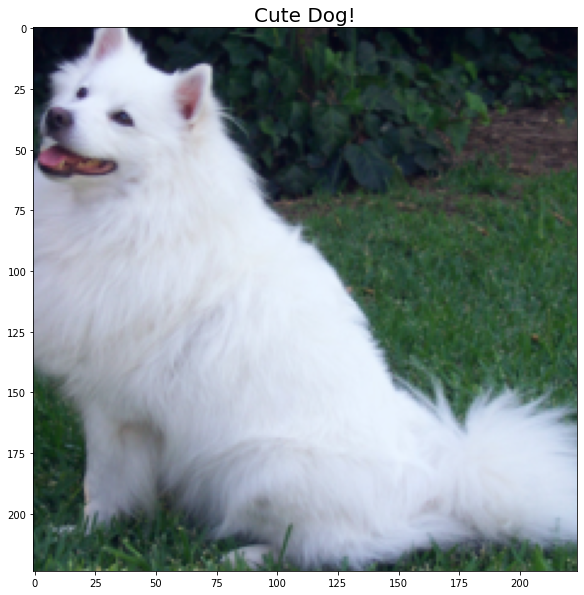

In [ ]:
# Open image using PIL library
import requests
from io import BytesIO

img_url = "https://github.com/pytorch/hub/raw/master/images/dog.jpg"
response = requests.get(img_url)
img_pil = Image.open(BytesIO(response.content))

# Process it to be useable
img_tensor = preprocess(img_pil)

# Create a mini-batch as expected by the model
img_batch = img_tensor.unsqueeze(0)

# Have a look at Dog! (Because it's cute)
plt.figure(figsize = (10,10))
plt.title("Cute Dog!", fontsize  = 20)
plt.imshow(torchvision.utils.make_grid(img_tensor, nrow=1, normalize=True).numpy().transpose((1, 2, 0)))

In [ ]:
# Define eval_img function to predict pretrained model output for above image

def eval_img(img_batch,model):
    num_imgs = img_batch.shape[0]
    with torch.no_grad():
        output = model(img_batch)

    probabilities = torch.nn.functional.softmax(output[0], dim=0)

    # Show top categories per image
    top1_prob, top1_catid = torch.topk(probabilities, 1)

    if num_imgs > 1:
        cat_name = [categories[i] for i in top1_catid]
    else:
        cat_name = categories[top1_catid]

    return top1_prob.item(), top1_catid.item(), cat_name


In [ ]:
# Call eval_img function
prob0, dummy1, pred_class_name = eval_img(img_batch, resnet_model)

In [ ]:
# Define occlusion_sensitivity function

def occlusion_sensitivity(patch_size, patch_stride, img_tensor, model):
    C, H, W = img_tensor.shape

    n_patches = np.floor(1+(H-patch_size)/patch_stride).astype(int)

    img_prob = np.zeros([n_patches,n_patches])

    the_patch = torch.from_numpy(np.zeros([patch_size,patch_size]))

    for height in range(0, (n_patches*patch_stride), patch_stride):
      for width in range(0, (n_patches*patch_stride), patch_stride):
        probability_tensor_small = img_tensor.clone()

        # Doing one for each color layer because applying to all is tricky
        probability_tensor_small[0][width:width+patch_size , height:height+patch_size] = the_patch
        probability_tensor_small[1][width:width+patch_size , height:height+patch_size] = the_patch
        probability_tensor_small[2][width:width+patch_size , height:height+patch_size] = the_patch

        format_probability_tensor_small = probability_tensor_small.unsqueeze(0)
        probability, _ , _ = eval_img(format_probability_tensor_small, model)

        w_pos = (width/patch_stride)
        h_pos = (height/patch_stride)
        if width == 0:
          w_pos = 0
        if height == 0:
          h_pos = 0
        img_prob[int(w_pos)][int(h_pos)] = probability

    return img_prob

# Define plot_occlusion_sensitivity function
def plot_occlusion_sensitivity(img_tensor, img_prob, model):

    img_prob = occlusion_sensitivity(patch_size, patch_stride, img_tensor, model)

    # Use a heatmap to see how it does

    plt.imshow(img_prob, cmap='Wistia_r', interpolation='none')
    plt.colorbar()
    plt.show()

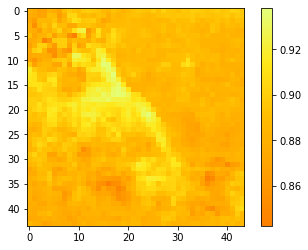

In [ ]:
patch_size = 5
patch_stride = 5

img_prob = occlusion_sensitivity(patch_size, patch_stride, img_tensor, resnet_model)
plot_occlusion_sensitivity(img_tensor, img_prob, resnet_model)

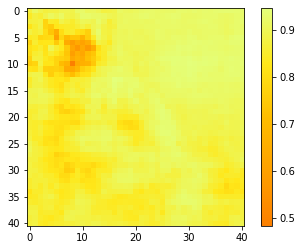

In [ ]:
patch_size = 20
patch_stride = 5

img_prob = occlusion_sensitivity(patch_size, patch_stride, img_tensor, resnet_model)
plot_occlusion_sensitivity(img_tensor, img_prob, resnet_model)

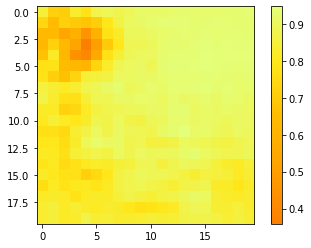

In [ ]:
patch_size = 30
patch_stride = 10

img_prob = occlusion_sensitivity(patch_size, patch_stride, img_tensor, resnet_model)
plot_occlusion_sensitivity(img_tensor, img_prob, resnet_model)

In [ ]:
print(pred_class_name)

Samoyed


Predicted class is a marmot


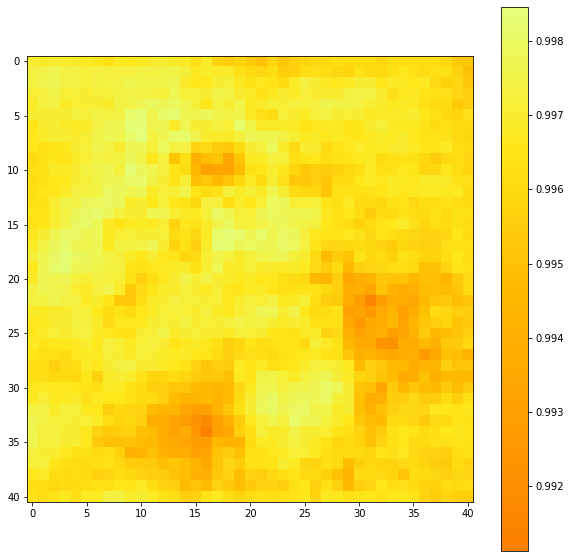

In [ ]:
# Try is on a marmot

# Open image using PIL library
img_url = "https://nationaltoday.com/wp-content/uploads/2021/11/Marmot-Day.jpg"
img_pil = Image.open(requests.get(img_url, stream=True).raw)

# Now preprocess above image
img_tensor = preprocess(img_pil)

# Create a mini-batch as expected by the model
img_batch = img_tensor.unsqueeze(0)

# Evaluate the image
prob0, dummy1, pred_class_name = eval_img(img_batch, resnet_model)

# Plot occlusion
patch_size = 20
patch_stride = 5

print("Predicted class is a " + str(pred_class_name))

# Have a look at Marmot! (Because it's cute)
plt.figure(figsize = (10,10))
plt.imshow(torchvision.utils.make_grid(img_tensor, nrow=1, normalize=True).numpy().transpose((1, 2, 0)))

img_prob = occlusion_sensitivity(patch_size, patch_stride, img_tensor, resnet_model)
plot_occlusion_sensitivity(img_tensor, img_prob, resnet_model)

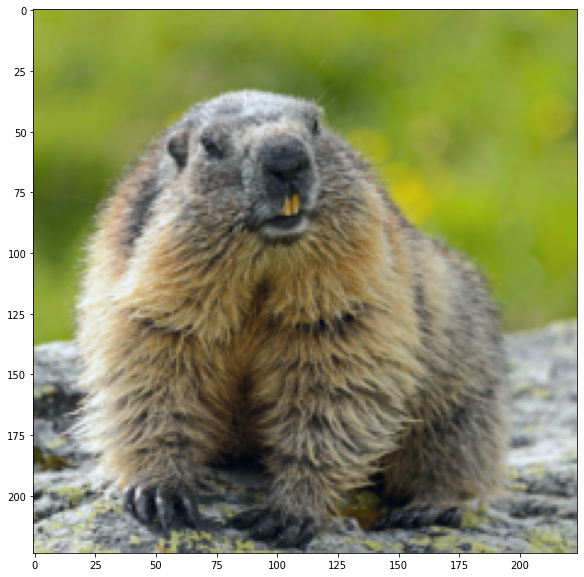

In [ ]:
plt.figure(figsize = (10,10))
plt.imshow(torchvision.utils.make_grid(img_tensor, nrow=1, normalize=True).numpy().transpose((1, 2, 0)))

In [ ]:
# Facial detection with RESNET


class FLD_Data(Dataset):
    def __init__(self, trn_tst = 0, transform=transforms.ToTensor()):
        # Load numpy data
        data = np.load(PATH_DATASETS + '/face_landmark.npz')
        if trn_tst == 0:
            # Create dataset for trainloader
            self.images = data['train_images']
            self.landmarks = data['train_landmarks']
        else:
            # Create dataset for testloader
            self.images = data['test_images']
            self.landmarks = data['test_landmarks']

        self.transform = transform

    # Define len function
    def __len__(self):
        return len(self.landmarks)

    # Define getitem function
    def __getitem__(self, idx):

        images = self.images[idx,:]
        landmarks = self.landmarks[idx]

        if self.transform is not None:
            images = self.transform(images)

        return images, landmarks

In [ ]:
## Set train and test datasets

train_dataset = FLD_Data(0)
test_dataset = FLD_Data(1)

In [ ]:
# Hyper Params
BatchSize = 64

# split the dataset into validation and test sets
len_train_set = int(len(train_dataset) * 0.901)
len_valid_set = len(train_dataset) - len_train_set

train_dataset , valid_dataset  = torch.utils.data.random_split(train_dataset, [len_train_set, len_valid_set]) ## Split train data

# shuffle and batch the datasets
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BatchSize, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=BatchSize, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BatchSize, shuffle=False)

print("The length of Train set is {}".format(len_train_set))
print("The length of Valid set is {}".format(len_valid_set))
print("The length of Test set is {}".format(len(test_dataset)))

The length of Train set is 696
The length of Valid set is 77
The length of Test set is 221


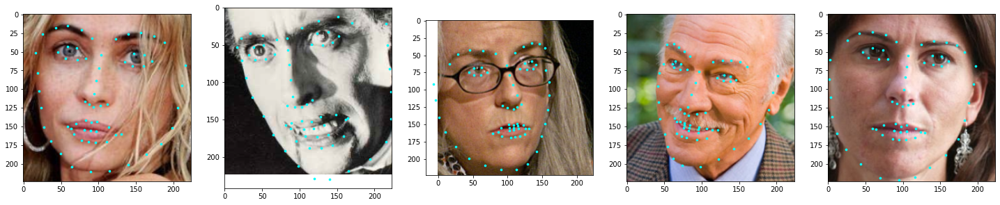

In [ ]:
# Visualise a few images along with each image's landmarks
how_many_images_to_display = 5


# We can create an iterater using the dataloaders and take a random sample
images, points = next(iter(train_loader))

# Reverse normalization on images
inv_normalize = transforms.Normalize(
                    mean=[-0.5/0.5, -0.5/0.5, -0.5/0.5],
                    std=[1/0.5, 1/0.5, 1/0.5]
                )

images = inv_normalize(images)
da = how_many_images_to_display

# visualize dataset using torchvision grid
plt.figure(figsize = (25,15))

for i in range(0,da):
  plt.subplot(1,da,(i+1))
  plt.imshow(torchvision.utils.make_grid(images[i], nrow=1, normalize=True).numpy().transpose((1, 2, 0)))
  x, y = points[i].T
  plt.scatter(x,y, color = "aqua", s = 7)


In [ ]:
from operator import xor
from torchvision.models import resnet18, ResNet18_Weights

class FaceLandmarkDetection(LightningModule):
    def __init__(self, learning_rate=5e-4, num_classes=136):
        super().__init__()

        self.learning_rate = learning_rate
        self.loss_fun = nn.MSELoss()

        self.model_name = "resetnet"

        # Use some imported weights
        self.model = resnet18(weights = ResNet18_Weights.IMAGENET1K_V1)

        # freeze resnet18 weights
        for param in self.model.parameters():
          param.requires_grad = False

        self.model = self.model.to(device)

        # Remake the resnet18 FC layer
        # This changes the last fc layer
        self.model.fc = nn.Linear(self.model.fc.in_features, num_classes)

        self.train_error = MeanSquaredError()
        self.val_error = MeanSquaredError()
        self.test_error = MeanSquaredError()


    def forward(self, x):
        x = self.model(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x).float()
        landmarks = y.reshape(preds.shape).float()

        loss = self.loss_fun(preds, landmarks)
        error = self.val_error(preds, landmarks)

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_error", error, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x).float()
        landmarks = y.reshape(preds.shape).float()

        loss = self.loss_fun(preds, landmarks)
        error = self.val_error(preds, landmarks)

        self.log("val_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("val_error", error, prog_bar=True, on_step=False, on_epoch=True)


    def test_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x).float()
        landmarks = y.reshape(preds.shape).float()

        loss = self.loss_fun(preds, landmarks)

        self.log("test_loss", loss, prog_bar=True)


    def predict_step(self, batch, batch_idx):

        x, y = batch
        preds = self(x).float()
        landmarks = y.reshape(preds.shape).float()

        loss = self.loss_fun(preds, landmarks)

        pred_landmark = preds.reshape(y.shape)
        orig_landmark = y
        orig_image = x

        return pred_landmark, orig_landmark, orig_image

    def configure_optimizers(self):

        optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)

        return optimizer

    ####################
    # DATA RELATED HOOKS
    ####################

    def train_dataloader(self):
        return train_loader

    def val_dataloader(self):
        return valid_loader

    def test_dataloader(self):
        return test_loader

In [ ]:
FaceLandmarkDetection_model = FaceLandmarkDetection()

# Define checkpoint callback function to save best model
checkpoint_callback_f = ModelCheckpoint( monitor="val_loss",
                                          dirpath="/content/gdrive/MyDrive/Assignment2/folder/FacialLandmarks/checkpoint/",
                                          save_top_k=1,
                                          mode="min",
                                          every_n_epochs=1)


# Train and test the model
trainer_f = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,
    max_epochs=200,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_f,  EarlyStopping('val_loss', patience  = 10, mode = 'min')],
    logger=CSVLogger(save_dir="/content/gdrive/MyDrive/Assignment2/folder/FacialLandmarks/logs/"),
)
trainer_f.fit(FaceLandmarkDetection_model)
trainer_f.test()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:616: UserWarning: Checkpoint directory /content/gdrive/MyDrive/Assignment2/folder/FacialLandmarks/checkpoint exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type             | Params
-------------------------------------------------
0 | loss_fun    | MSELoss          | 0     
1 | model       | ResNet           | 11.2 M
2 | train_error | MeanSquaredError | 0     
3 | val_error   | Mea

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1896: PossibleUserWarning: The number of training batches (11) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1390: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  + f" You can pass `.{fn}(ckpt_path='best')` to use the best model or"
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/gdrive/MyDrive/Assignment2/folder/FacialLandmarks/checkpoint/epoch=190-step=2101.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from checkpoint at /content/gdrive/MyDrive/Assignment2/folder/FacialLandmarks/checkpoint/epoch=190-step=2101.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss            345.8233642578125
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 345.8233642578125}]

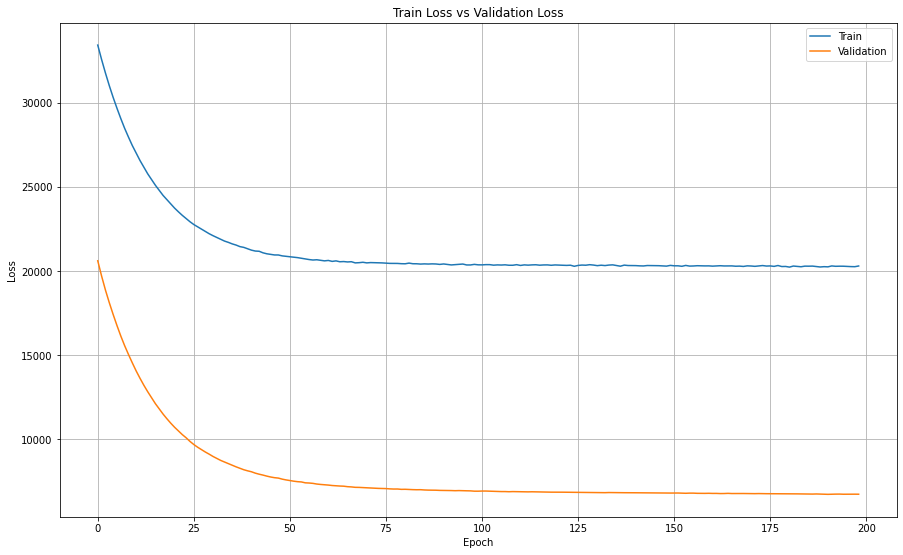

In [ ]:
## Plot train and validation losses!

trainer_data_f = pd.read_csv(trainer_f.logger.log_dir + "/metrics.csv")
trainer_data_f.set_index("epoch", inplace=True)
trainer_data_f = trainer_data_f.groupby(level=0).sum().drop("step", axis=1)

## Plot validation and train loss, both against epoch
fig_2 = plt.figure(figsize = (15,20))
x = trainer_data_f["val_loss"][:-1]
z = trainer_data_f["train_loss"][:-1]

## Loss ##
plt.subplot(2,1,1)
plt.plot(trainer_data_f["train_loss"][:-1])
plt.plot(trainer_data_f["val_loss"][:-1])

plt.grid(True)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train Loss vs Validation Loss")
_ = plt.legend(["Train", "Validation"])

# This doesn't look right..

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 11it [00:00, ?it/s]

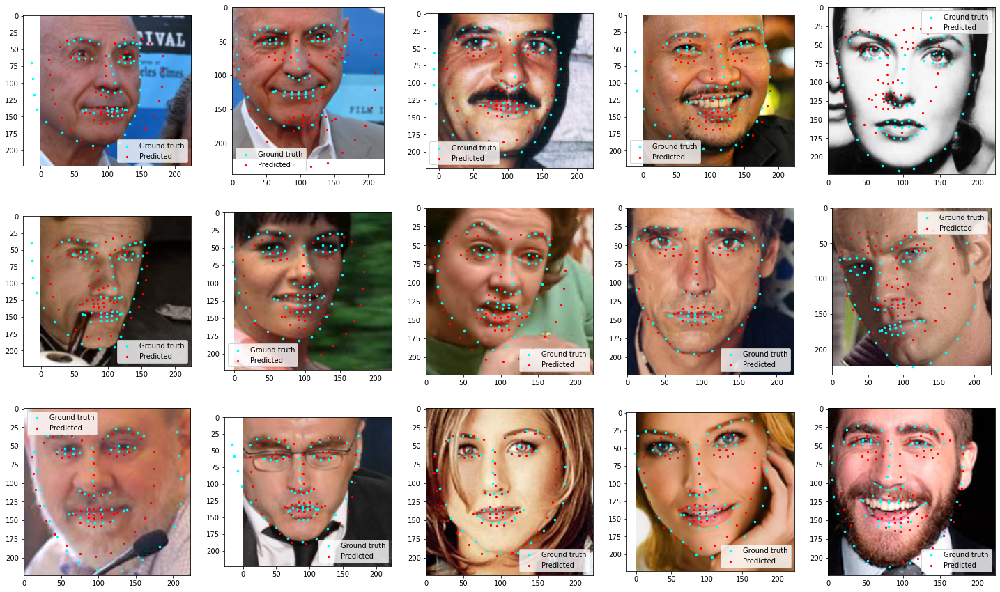

In [ ]:
# See how it did!

# Displays the first x images of each batch

batch_number = 3

# Make sure image amount is divisible by row number
how_many_images_to_display = 15
images_per_row = 5

# Generate predictions using predict function
output = trainer_f.predict(FaceLandmarkDetection_model, test_loader)

pred_landmark = output[batch_number][0]
orig_landmark = output[batch_number][1]
orig_image = output[batch_number][2]

da = how_many_images_to_display
columns = how_many_images_to_display / images_per_row

plt.figure(figsize = (25,15))

for i in range(0,da):
  plt.subplot(columns, images_per_row, (i+1))
  plt.imshow(torchvision.utils.make_grid(orig_image[i], nrow=1, normalize=True).numpy().transpose((1, 2, 0)))
  x, y = orig_landmark[i].T
  plt.scatter(x,y, color = "aqua", s = 7)
  x, y = pred_landmark[i].T
  plt.scatter(x,y, color = "red", s = 5)
  _ = plt.legend(["Ground truth", "Predicted"])
